In [1]:
import os
import pathlib
#pickle file

if "models" in pathlib.Path.cwd().parts:
  while "models" in pathlib.Path.cwd().parts:
    os.chdir('..')
elif not pathlib.Path('models').exists():
  !git clone --depth 1 https://github.com/tensorflow/models

In [2]:
os.environ['PATH'] += ":/git/ai4eutils"
os.environ['PATH'] += ":/git/CameraTraps"

In [3]:
import numpy as np
import six.moves.urllib as urllib
import sys
import tarfile
import tensorflow as tf
import zipfile
import shutil 
import json
import matplotlib
#matplotlib.use('Agg')
from matplotlib import pyplot as plt
from collections import defaultdict
from io import StringIO
from PIL import Image
from IPython.display import display

In [4]:
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as vis_util
from object_detection.utils import metrics
from object_detection.utils import per_image_evaluation
from utils import *


In [5]:
from object_detection.utils import ops as utils_ops
# patch tf1 into `utils.ops`
utils_ops.tf = tf.compat.v1

# Patch the location of gfile
tf.gfile = tf.io.gfile


In [21]:
def load_pickle(pickle_file):
    try:
        with open(pickle_file, 'rb') as f:
            pickle_data = pickle.load(f)
    except UnicodeDecodeError as e:
        with open(pickle_file, 'rb') as f:
            pickle_data = pickle.load(f, encoding='latin1')
    except Exception as e:
        print('Unable to load data ', pickle_file, ':', e)
        raise
    return pickle_data

In [13]:
#data = load_pickle('Detection_Results/CCT_Detection_Results_1-Copy1.p')

In [17]:
#print(data['images'][0])

596a4e6b-23d2-11e8-a6a3-ec086b02610b


In [6]:
#detection_img = os.listdir('single')
with open('outx.json') as f: 
  detection_data = json.load(f)
detection_img_set = set()
i = 0
for i in range(len(detection_data['images'])):
  detection_img_set.add(detection_data['images'][i]['file'][40:len(detection_data['images'][i]['file']) - 4])
#print(detection_img_set)

with open('cis_test_mod.json', 'r') as f: 
  cis_test_data = json.load(f)

cis_test_data_set = set()
i = 0
for i in range(len(cis_test_data['annotations'])):
  cis_test_data_set.add(cis_test_data['annotations'][i]['image_id'])
  

with open('cis_val_mod.json', 'r') as f: 
  cis_val_data = json.load(f)

cis_val_data_set = set()
i = 0
for i in range(len(cis_val_data['annotations'])):
  cis_val_data_set.add(cis_val_data['annotations'][i]['image_id'])


with open('train_mod.json', 'r') as f: 
  train_data = json.load(f)

train_data_set = set()
i = 0
for i in range(len(train_data['annotations'])):
  train_data_set.add(train_data['annotations'][i]['image_id'])


with open('trans_test_mod.json', 'r') as f: 
  trans_test_data = json.load(f)

trans_test_data_set = set()
i = 0
for i in range(len(trans_test_data)):
  trans_test_data_set.add(trans_test_data['annotations'][i]['image_id'])


with open('trans_val_mod.json', 'r') as f: 
  trans_val_data = json.load(f)

trans_val_data_set = set()
i = 0
for i in range(len(trans_val_data)):
  trans_val_data_set.add(trans_val_data['annotations'][i]['image_id'])

In [76]:
import random
import numpy as np

def cluster_detections_by_image(results, use_im=None):
  #if use_im == None:
        #use_im = {im:True for im in results['images'][0]}
  
  mod_res={}
  for idx in range(len(results['images'])):
    name = results['images'][idx]['file'][40:-4]
    #print(idx, ': ', results['images'][idx]['detections'])
    #print(results['images'][idx]['file'])
    mod_res[name]= {'bboxes':[], 'scores':[], 'labels':[]}
    if 'detections' in results['images'][idx]:
        for x in range(len(results['images'][idx]['detections'])):
            if 'bbox' in results['images'][idx]['detections'][x].keys():
                mod_res[name]['bboxes'].append(results['images'][idx]['detections'][x]['bbox'][:])
          #print(mod_res[results['images'][idx]['file']]['bboxes'])
            if 'conf' in results['images'][idx]['detections'][x].keys():
                mod_res[name]['scores'].append(results['images'][idx]['detections'][x]['conf'])
          #mod_res[results['images'][idx]['file']]['labels'].append(results['images'][idx]['detections'][x]['category'])
            if 'category' in results['images'][idx]['detections'][x].keys():
                for i in range(len(results['images'][idx]['detections'][x]['category'])):
            #print(mod_res[results['images'][idx]['file']]['labels'])
                    mod_res[name]['labels'].append(int(results['images'][idx]['detections'][x]['category'][i]))
      #for i in range(len(mod_res[results['images'][idx]['file']]['bboxes'])):
        #x = mod_res[results['images'][idx]['file']]['bboxes'][i][0]
        #y = mod_res[results['images'][idx]['file']]['bboxes'][i][1]
        #w = mod_res[results['images'][idx]['file']]['bboxes'][i][2]
        #h = mod_res[results['images'][idx]['file']]['bboxes'][i][3]

        #mod_res[results['images'][0]['file']]['bboxes'][0][2] = x + w
        #mod_res[results['images'][0]['file']]['bboxes'][0][3] = y + h
  #print(mod_res)
  return mod_res

def cluster_ground_truth_by_image(truth, use_im=None):
    if use_im == None:
        for idx in range(len(truth)):
            use_im = {im:True for im in truth['annotations'][idx]}

    mod_truth = {}

    for ann in truth['annotations']:  
        for i in truth['images']:
            if ann['image_id'] == i['id']:
                width = i['width']
                height = i['height']
        if ann['image_id'] not in mod_truth:
            if 'bbox' in ann:
                mod_truth[ann['image_id']] = {'bboxes':[], 'labels':[]}
                mod_truth[ann['image_id']]['bboxes'].append(ann['bbox'][:])
                mod_truth[ann['image_id']]['labels'].append(ann['category_id'])
            else: 
                mod_truth[ann['image_id']] = {'labels':[]}
                mod_truth[ann['image_id']]['labels'].append(ann['category_id'])
        else: 
            if 'bbox' not in ann:
                mod_truth[ann['image_id']]['labels'].append(ann['category_id'])
            else:
                mod_truth[ann['image_id']]['bboxes'].append(ann['bbox'][:])
                mod_truth[ann['image_id']]['labels'].append(ann['category_id'])
        #print(mod_truth[ann['image_id']])
            
    for key in mod_truth:
        if 'bboxes' in  mod_truth[key]:
      #mapping coordinates
            for i in range(len(mod_truth[key]['bboxes'])):
                x = mod_truth[key]['bboxes'][i][0]
                y = mod_truth[key]['bboxes'][i][1]
                w = mod_truth[key]['bboxes'][i][2]
                h = mod_truth[key]['bboxes'][i][3]
                mod_truth[key]['bboxes'][i][2] = x + w
                mod_truth[key]['bboxes'][i][3] = y + h 

              #normalizing bbox coordinates
                mod_truth[key]['bboxes'][i][0] /= width
                mod_truth[key]['bboxes'][i][1] /= height
                mod_truth[key]['bboxes'][i][2] /= width
                mod_truth[key]['bboxes'][i][3] /= height
  
      
 # visualize_detector_output(mod_truth['58629440-23d2-11e8-a6a3-ec086b02610b']['bboxes'][0], '/content/drive/My Drive/CCT_Data/single/58629440-23d2-11e8-a6a3-ec086b02610b.jpg')
  #print(mod_truth)
    return mod_truth

annType = 'bbox'

def compute_precision_recall(detection_file, ground_truth_file, detection_results=None,images_to_consider='all', get_night_day = None, per_image_eval=None):
    if detection_results == None: 
        with open(detection_file, 'r') as f: 
            detection_results = json.load(f)
    if ground_truth_file != None:
        with open(ground_truth_file, 'r' ) as f:
            ground_truth = json.load(f)
    else:
        ground_truth = None
  #print(ground_truth)
  
    data = {}
    use_im = get_images_to_consider(detection_results, images_to_consider='all')
    per_image_detections = cluster_detections_by_image(detection_results, use_im)
    
    if ground_truth != None:
        per_image_gts = cluster_ground_truth_by_image(ground_truth, None)
  #print(per_image_detections[img_name])
    if per_image_eval == None:
        per_image_eval = per_image_evaluation.PerImageEvaluation(
            num_groundtruth_classes=1,
            matching_iou_threshold=0.5,
            nms_iou_threshold=1.0,
            nms_max_output_boxes=10000
        )
        
    detection_labels = []
    detection_scores = []
    num_total_gts = 0
    count = 0
    
    for image_id, dets in per_image_detections.items():
        if image_id[-4:] == ' (1)':
            image_id = image_id[:-4]            
        #if image_id == img_name:
        #print(image_id)
        #print(dets)
        num_detections = len(dets['bboxes'])
        detected_boxes = np.zeros([num_detections, 4], dtype=np.float32)
        detected_scores = np.zeros([num_detections], dtype=np.float32)
        detected_class_labels = np.zeros([num_detections], dtype=np.int32)
        detected_masks = None
        for i in range(num_detections):
            x1 = dets['bboxes'][i][0]
            y1 = dets['bboxes'][i][1]
            x2 = dets['bboxes'][i][2] + dets['bboxes'][i][0]
            y2 = dets['bboxes'][i][3] + dets['bboxes'][i][1]
            detected_boxes[i] = np.array([y1, x1, y2, x2])
            #print(detected_boxes)
            detected_scores[i] = dets['scores'][i]          
            detected_class_labels[i] = int(dets['labels'][i]) - 1
             #  print(image_id)
            
        if ground_truth == None:
            gts = []
        else:                #print(ground_truth[image_id])
            gts = per_image_gts[image_id]
        if 'bboxes' in gts:
            num_gts = len(gts['bboxes'])
        else:
            num_gts = 0
        #print(num_gts)
        if num_gts > 0:
            # [ymin, xmin, ymax, xmax] in absolute image coordinates
            groundtruth_boxes = np.zeros([num_gts, 4], dtype=np.float32)
            # 0-indexed groundtruth classes for the boxes
            groundtruth_class_labels = np.zeros(num_gts, dtype=np.int32)
            groundtruth_masks = None
            groundtruth_is_difficult_list = np.zeros(num_gts, dtype=bool)
            groundtruth_is_group_of_list = np.zeros(num_gts, dtype=bool)
            
            for i in range(num_gts):
                x1 = gts['bboxes'][i][0]
                y1 = gts['bboxes'][i][1]
                x2 = gts['bboxes'][i][2]
                y2 = gts['bboxes'][i][3]
                groundtruth_boxes[i] = np.array([y1, x1, y2, x2])
                groundtruth_class_labels[i] = int(gts['labels'][i]) - 1
                
            #print('groundtruth_class_labels: ', groundtruth_class_labels)
            #print('detected_boxes: ', detected_boxes, 'groundtruth_boxes: ', groundtruth_boxes)
            #print("detected_scores: ", detected_scores)
            #print("detected_class_labels: ", detected_class_labels)
            #print('groundtruth_is_group_of_list: ', groundtruth_is_group_of_list)
            #print('groundtruth_is_difficult_list: ', groundtruth_is_difficult_list)
            #print('groundtruth_masks: ', groundtruth_masks)

                    #print(len(groundtruth_boxes[0]), ' ', len(detected_boxes[0]))
            data[image_id] = {'scores': [], 'tp_fp_labels': []}
            #data[image_id] = {'tp_fp_labels': []}
            scores, tp_fp_labels, is_class_correctly_detected_in_image = (
                per_image_eval.compute_object_detection_metrics(
                    detected_boxes=detected_boxes,
                    detected_scores=detected_scores,
                    detected_class_labels=detected_class_labels,
                    groundtruth_boxes=groundtruth_boxes,
                    groundtruth_class_labels=groundtruth_class_labels,
                    groundtruth_is_difficult_list=groundtruth_is_difficult_list,
                    groundtruth_is_group_of_list=groundtruth_is_group_of_list,
                    detected_masks=detected_masks,
                    groundtruth_masks=groundtruth_masks
                )
            )
            
            
            for i in scores[0]:
                data[image_id]['scores'].append(float(i))
                
            for i in tp_fp_labels[0]:
                data[image_id]['tp_fp_labels'].append(bool(i))
                #print(image_id)
                    
            
            #print(data[image_id])
            
                #print('detection_labels: ', detection_labels)
                #print('detection_scores: ', detection_scores)
            detection_labels.append(tp_fp_labels[0])
            detection_scores.append(scores[0])
            #print('detection_labels: ', detection_labels)
            #print('detection_scores: ', detection_scores)
            num_total_gts += num_gts

            count +=1
            if count % 1000 == 0:
                print(str(count) + ' images complete') 
        else:
            detection_labels.append(np.zeros(num_detections, dtype=np.int32))
            detection_scores.append(detected_scores)

            
    scores = np.concatenate(detection_scores)
    labels = np.concatenate(detection_labels).astype(np.bool)
    
    precision, recall = metrics.compute_precision_recall(
        scores, labels, num_total_gts
    )
    
    
    average_precision = metrics.compute_average_precision(precision, recall)
    
    print(type(data))
    
    #f = open('FalsePositives.json', 'w')
    
    write_data = json.dumps(data)
    
    with open('FalsePositives.json', 'w') as f:
        f.write(write_data)
        
    return precision, recall, average_precision

def get_images_to_consider(detection_results, images_to_consider):
  if images_to_consider == 'all':
    use_im = {im:True for im in detection_results['images'][0]}




In [14]:
cis_test = False
cis_val = False
train = False
trans_test = False
trans_val = False
index = 0 

name = '59ddc16b'

for i in range(len(cis_test_data['images'])): 
    if name + '-23d2-11e8-a6a3-ec086b02610b' + '.jpg' == cis_test_data['images'][i]['file_name']:
        cis_test = True
        index = i
        
for i in range(len(cis_val_data['images'])): 
    if name + '-23d2-11e8-a6a3-ec086b02610b' + '.jpg' == cis_val_data['images'][i]['file_name']:
        cis_val = True
        index = i

for i in range(len(train_data['images'])): 
    if name + '-23d2-11e8-a6a3-ec086b02610b' + '.jpg' == train_data['images'][i]['file_name']:
        train = True
        index = i

for i in range(len(trans_test_data['images'])): 
    if name + '-23d2-11e8-a6a3-ec086b02610b' + '.jpg' == trans_test_data['images'][i]['file_name']:
        trans_test = True
        index = i
        
for i in range(len(trans_val_data['images'])): 
    if name + '-23d2-11e8-a6a3-ec086b02610b' + '.jpg' == trans_val_data['images'][i]['file_name']:
        trans_val = True
        index = i
        
for i in range(len(trans_test_data['annotations'])):
    if name + '-23d2-11e8-a6a3-ec086b02610b' == trans_test_data['annotations'][i]['image_id']:
        print(i)

for i in range(len(trans_val_data['annotations'])):
    if name + '-23d2-11e8-a6a3-ec086b02610b' == trans_val_data['annotations'][i]['image_id']:
        print(i)

for i in range(len(train_data['annotations'])):
    if name + '-23d2-11e8-a6a3-ec086b02610b' == train_data['annotations'][i]['image_id']:
        print(i)
        
for i in range(len(cis_test_data['annotations'])):
    if name + '-23d2-11e8-a6a3-ec086b02610b' == cis_test_data['annotations'][i]['image_id']:
        print(i)
        
for i in range(len(cis_val_data['annotations'])):
    if name + '-23d2-11e8-a6a3-ec086b02610b' == cis_val_data['annotations'][i]['image_id']:
        print(i)
        
print('cis_test: ', cis_test)
print('cis_val: ', cis_val)
print('train: ', train)
print('trans_test: ', trans_test)
print('trans_val: ', trans_val)
print(index)

21581
cis_test:  False
cis_val:  False
train:  False
trans_test:  True
trans_val:  False
7579


In [45]:
with open('CaltechCameraTrapsECCV18.json', 'r') as f:
  truth_data = json.load(f)

animal_categories = [6, 1, 9, 3, 11, 8, 16, 5, 10, 7, 99, 21, 34, 51]


t = 0
for z in truth_data["annotations"]: 
  if truth_data['annotations'][t]['category_id'] in animal_categories: 
    truth_data['annotations'][t]['category_id'] = 1
  elif truth_data['annotations'][t]['category_id'] == 33:
    truth_data['annotations'][t]['category_id'] = 3;
  else: 
    truth_data['annotations'][t]['category_id'] = 2;
  t += 1

data = json.dumps(truth_data)

with open('ModCaltechCameraTrapsECCV18.json', 'w') as f:
  f.write(data)

In [77]:
detection_file = 'outx.json' 
ground_truth_file = 'ModCaltechCameraTrapsECCV18.json'
print(compute_precision_recall(detection_file, ground_truth_file))
#for i in detection_img_set:
  #print(i)
  #if i in cis_test_data_set:
    #ground_truth_file = 'cis_test_mod.json'
    #print(compute_precision_recall(i, detection_file, ground_truth_file))
  #elif i in cis_val_data_set:
    #ground_truth_file = 'cis_val_mod.json'
    #print(compute_precision_recall(i, detection_file, ground_truth_file))
  #elif i in train_data_set:
    #ground_truth_file = 'train_mod.json'
    #print(compute_precision_recall(i, detection_file, ground_truth_file))
  #elif i in trans_val_data_set:
    #ground_truth_file = 'trans_val_mod.json'
    #print(compute_precision_recall(i, detection_file, ground_truth_file))
  #elif i in trans_test_data_set:
    #ground_truth_file = 'trans_test_mod.json'
    #print(compute_precision_recall(i, detection_file, ground_truth_file))
  #else:
    #print('nothing')
    #print(compute_precision_recall(i, detection_file, None))
   
    
#plan: tensorflow error fix --> save all the precision[2] to a set --> sort by that number from least to great --> plot the ground truth & detections on those images

1000 images complete
2000 images complete
3000 images complete
4000 images complete
<class 'dict'>
(array([1.        , 1.        , 1.        , ..., 0.68498413, 0.68486974,
       0.68475538]), array([2.22915738e-04, 4.45831476e-04, 6.68747214e-04, ...,
       9.14177441e-01, 9.14177441e-01, 9.14177441e-01]), 0.8818385860645166)


In [38]:
from PIL import Image, ImageDraw
import random
import os
import json
import matplotlib
matplotlib.use('TkAgg')
from matplotlib import pyplot

def mod_detections_by_image(results, use_im=None):
  if use_im == None:
        use_im = {im:True for im in results['images'][0]}
  
  mod_res={}
  for idx in range(len(results['images'])):
    name = results['images'][idx]['file'][40:-4]
    #print(idx, ': ', results['images'][idx]['detections'])
    #print(results['images'][idx]['file'])
    mod_res[name]= {'bboxes':[], 'scores':[], 'labels':[]}
    #print(idx)
    if 'detections' in results['images'][idx]:
        for x in range(len(results['images'][idx]['detections'])):
            if 'bbox' in results['images'][idx]['detections'][x].keys():
                mod_res[name]['bboxes'].append(results['images'][idx]['detections'][x]['bbox'][:])
          #print(mod_res[results['images'][idx]['file']]['bboxes'])
            if 'conf' in results['images'][idx]['detections'][x].keys():
                mod_res[name]['scores'].append(results['images'][idx]['detections'][x]['conf'])
          #mod_res[results['images'][idx]['file']]['labels'].append(results['images'][idx]['detections'][x]['category'])
            if 'category' in results['images'][idx]['detections'][x].keys():
                for i in range(len(results['images'][idx]['detections'][x]['category'])):
            #print(mod_res[results['images'][idx]['file']]['labels'])
                    mod_res[name]['labels'].append(int(results['images'][idx]['detections'][x]['category'][i]))

      #for i in range(len(mod_res[results['images'][idx]['file']]['bboxes'])):
        #x = mod_res[results['images'][idx]['file']]['bboxes'][i][0]
        #y = mod_res[results['images'][idx]['file']]['bboxes'][i][1]
        #w = mod_res[results['images'][idx]['file']]['bboxes'][i][2]
        #h = mod_res[results['images'][idx]['file']]['bboxes'][i][3]

        #mod_res[results['images'][0]['file']]['bboxes'][0][2] = x + w
        #mod_res[results['images'][0]['file']]['bboxes'][0][3] = y + h
  #print(mod_res)
  return mod_res

    
def cluster_mod_bbox(truth, use_im=None):
    if use_im == None:
        for idx in range(len(truth)):
            use_im = {im:True for im in truth['annotations'][idx]}

    mod_truth = {}

    for ann in truth['annotations']:  
        for i in truth['images']:
            if ann['image_id'] == i['id']:
                width = i['width']
                height = i['height']
        if ann['image_id'] not in mod_truth:
            if 'bbox' in ann:
                mod_truth[ann['image_id']] = {'bboxes':[], 'labels':[]}
                mod_truth[ann['image_id']]['bboxes'].append(ann['bbox'][:])
                mod_truth[ann['image_id']]['labels'].append(ann['category_id'])
            else: 
                mod_truth[ann['image_id']] = {'labels':[]}
                mod_truth[ann['image_id']]['labels'].append(ann['category_id'])
        else: 
            if 'bbox' not in ann:
                mod_truth[ann['image_id']]['labels'].append(ann['category_id'])
            else:
                mod_truth[ann['image_id']]['bboxes'].append(ann['bbox'][:])
                mod_truth[ann['image_id']]['labels'].append(ann['category_id'])
        #print(mod_truth[ann['image_id']])
            
    for key in mod_truth:
        if 'bboxes' in  mod_truth[key]:
      #mapping coordinates
            for i in range(len(mod_truth[key]['bboxes'])):
                x = mod_truth[key]['bboxes'][i][0]
                y = mod_truth[key]['bboxes'][i][1]
                w = mod_truth[key]['bboxes'][i][2]
                h = mod_truth[key]['bboxes'][i][3]
                mod_truth[key]['bboxes'][i][2] = x + w
                mod_truth[key]['bboxes'][i][3] = y + h 

              #normalizing bbox coordinates
                mod_truth[key]['bboxes'][i][0] /= width
                mod_truth[key]['bboxes'][i][1] /= height
                mod_truth[key]['bboxes'][i][2] /= width
                mod_truth[key]['bboxes'][i][3] /= height
      
 
    return mod_truth

detection_file = 'outx.json' 
with open(detection_file, 'r') as f:
    dets_mod = json.load(f)
    
#print(dets_mod['images'][0]['detections'])
modmod_res = mod_detections_by_image(dets_mod, None)
mod_cis_test_truth = cluster_mod_bbox(cis_test_data, None)
mod_cis_val_truth = cluster_mod_bbox(cis_val_data, None)
mod_train_truth = cluster_mod_bbox(train_data, None)
mod_trans_test_truth = cluster_mod_bbox(trans_test_data, None)
mod_trans_val_truth = cluster_mod_bbox(trans_val_data, None)






In [26]:
#print(mod_trans_test_truth)
print('59eab90f-23d2-11e8-a6a3-ec086b02610b' in mod_trans_test_truth)
print(mod_res)

NameError: name 'mod_trans_test_truth' is not defined

In [16]:
img_list = os.listdir('eccv_18_all_images_sm')

def plot_boxes(key, detection, truth):
     with Image.open('eccv_18_all_images_sm/' + key + '.jpg') as img:
        print(img.size)
        width = img.size[0]
        height = img.size[1]
        draw = ImageDraw.Draw(img, mode='RGB')
        for i in range(len(detection[key]['bboxes'])):
            print (detection[key]['bboxes'])
            if 'bboxes' in truth[key].keys():
                tbox = truth[key]['bboxes'][i][:]
                print(tbox)
                if(tbox[0] < width):
                    tbox[0] *= width
                if(tbox[1] < height):
                    tbox[1] *= height
                if(tbox[2] < width):
                    tbox[2] *= width
                if(tbox[3] < height):
                    tbox[3] *= height
                draw.rectangle((tbox[1], tbox[0], tbox[3], tbox[2]), fill=None, outline='yellow', width=5)
            else:
                print('no')
                
            box = detection[key]['bboxes'][i][:]
                    #print(mod_truth[image_id]['bboxes'][0][0])
            if(box[0] < width):
                box[0] *= width
            if(box[1] < height):
                box[1] *= height
            if(box[2] < width):
                box[2] *= width
            if(box[3] < height):
                box[3] *= height
                
                
            draw.rectangle((box[1], box[0], box[3], box[2]), fill=None, outline='red', width=5)
                #draw.rectangle((tbox[1], tbox[0], tbox[3], tbox[2]), fill=None, outline='yellow', width=1)
                   # plt.plot([bbox[0],box[2],box[2],box[0],box[0]],[box[1],box[1],box[3],box[3],box[1]],'r')
                    
           
        pyplot.imshow(img)
        pyplot.show()
        _ = input("Press [enter] to continue.")
        plt.close()
                   # pyplot.plot([box[0],box[2],box[2],box[0],box[0]],[box[1],box[1],box[3],box[3],box[1]],'r')
            #pyplot.show()

i = 0

for key in detection_img_set:
    i += 1
    if key in mod_res:
        if key in cis_test_data_set:        
            plot_boxes(key, mod_res, mod_cis_test_truth)
        elif key in cis_val_data_set:
            plot_boxes(key, mod_res, mod_cis_val_truth)
        elif key in train_data_set:
            plot_boxes(key, mod_res, mod_train_truth)
        elif key in trans_test_data_set:
            plot_boxes(key, mod_res, mod_trans_test_truth)
        elif key in trans_val_data_set:
            plot_boxes(key, mod_res, mod_trans_val_truth)
        else:
            print('not found')     
    if(i > 3):
        break
    


    

(1024, 747)
[[0.0058, 0.5887, 0.1781, 0.1123]]
[0.02125, 0.5963052208835341, 0.22375, 0.6871218206157965]


KeyboardInterrupt: Interrupted by user

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
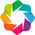

Loading BokehJS ...

In [52]:
import glob

import numpy as np

import skimage.io

import bokeh.io
import bokeh.plotting

import holoviews as hv

import panel as pn
pn.extension()

hv.extension('bokeh')

bokeh.io.output_notebook()

In [65]:
import random

def get_gt_boxes(key, ground_truth):
    gt_boxes = []
    if 'bboxes' in ground_truth[key].keys():
        gt_boxes = ground_truth[key]['bboxes'][:]
        #print(gt_boxes)
        #for i in range(len(ground_truth['bboxes'])):
            #gt_boxes.append(ground_truth['bboxes'][i]) 
    else:
        gt_boxes = [[0, 0, 0, 0]]
    
    return gt_boxes

def get_dt_boxes(key, detection):
    dt_boxes = []
    if 'bboxes' in detection[key].keys():
        dt_boxes = list(detection[key]['bboxes'][:])
        #for i in range(len(detection['bboxes'])):
            #dt_boxes.append(detection['bboxes'][i]) 
    else:
        dt_boxes = [[0, 0, 0, 0]]
    
    return dt_boxes
    
    
gt_boxes = []
dt_boxes = []
keys = []

mod_res = {}

for i in range(20):
    #t = random.randint(0, len(modmod_res) - 1)
    random_key = random.sample(list(modmod_res), 1)[0]
    random_key = random_key[0:36]
    mod_res[random_key] = modmod_res[random_key]
    
for key in mod_res.keys():
    if key == '':
        continue
    if key in mod_cis_test_truth:
        keys.append(key)
        #print(key)
        print(mod_cis_test_truth[key])
        gt_boxes.append(get_gt_boxes(key, mod_cis_test_truth))
        dt_boxes.append(get_dt_boxes(key, mod_res))
    elif key in mod_cis_val_truth: 
        keys.append(key)
        #print(key)
        print(mod_cis_val_truth[key])
        gt_boxes.append(get_gt_boxes(key, mod_cis_val_truth))
        dt_boxes.append(get_dt_boxes(key, mod_res))
    elif key in mod_train_truth: 
        keys.append(key)
        #print(key)
        print(mod_train_truth[key])
        gt_boxes.append(get_gt_boxes(key, mod_train_truth))
        dt_boxes.append(get_dt_boxes(key, mod_res))
    elif key in mod_trans_test_truth: 
        keys.append(key)
        #print(key)
        print(mod_trans_test_truth[key])
        gt_boxes.append(get_gt_boxes(key, mod_trans_test_truth))
        dt_boxes.append(get_dt_boxes(key, mod_res))
    elif key in mod_trans_val_truth:
        keys.append(key)
        #print(key)
        print(mod_trans_val_truth[key])
        gt_boxes.append(get_gt_boxes(key, mod_trans_val_truth))
        dt_boxes.append(get_dt_boxes(key, mod_res))
    else:
        keys.append(key)
        #print(key)
        #print(key in mod_trans_test_truth)
        print('None')
        gt_boxes.append([0, 0, 0, 0])
        dt_boxes.append(get_dt_boxes(key, mod_res))

print(len(keys))
print(gt_boxes)
print(dt_boxes)

{'bboxes': [[0.6725, 0.6237215528781794, 0.93625, 0.9030254350736278]], 'labels': [1]}
{'bboxes': [[0.79, 0.5894511378848729, 0.985625, 0.8327710843373495]], 'labels': [1]}
{'bboxes': [[0.125, 0.6442838018741633, 0.2825, 0.8327710843373495]], 'labels': [1]}
{'bboxes': [[0.8787499999999999, 0.3233333333333333, 0.9962499999999999, 0.5716666666666667]], 'labels': [1]}
{'labels': [2]}
{'bboxes': [[0.38, 0.433520749665328, 0.5862499999999999, 0.5825970548862116]], 'labels': [1]}
{'bboxes': [[0.1125, 0.7042570281124498, 0.27375, 0.8207764390896921]], 'labels': [1]}
{'bboxes': [[0.61375, 0.6391432396251674, 0.68375, 0.788219544846051]], 'labels': [1]}
{'bboxes': [[0.3575, 0.42666666666666664, 0.565, 0.5894511378848729]], 'labels': [1]}
{'bboxes': [[0.304, 0.5146666666666666, 0.361, 0.5706666666666667]], 'labels': [1]}
{'bboxes': [[0.0, 0.41466666666666663, 0.053000000000000005, 0.5186666666666666]], 'labels': [1]}
{'bboxes': [[0.1075, 0.5054886211512717, 0.36125, 0.6956894243641231]], 'labels

In [67]:
for key in keys:
    shutil.copy('eccv_18_all_images_sm/' + key + '.jpg', 'Checker', follow_symlinks=True)

In [68]:
imgs = glob.glob('Checker/*.jpg')
print(imgs)

['Checker\\58c0345e-23d2-11e8-a6a3-ec086b02610b.jpg', 'Checker\\58cb13cc-23d2-11e8-a6a3-ec086b02610b.jpg', 'Checker\\58cca729-23d2-11e8-a6a3-ec086b02610b.jpg', 'Checker\\58cca80d-23d2-11e8-a6a3-ec086b02610b.jpg', 'Checker\\58cca88e-23d2-11e8-a6a3-ec086b02610b.jpg', 'Checker\\58cfca7c-23d2-11e8-a6a3-ec086b02610b.jpg', 'Checker\\5984967b-23d2-11e8-a6a3-ec086b02610b.jpg', 'Checker\\5994209d-23d2-11e8-a6a3-ec086b02610b.jpg', 'Checker\\59da8c66-23d2-11e8-a6a3-ec086b02610b.jpg', 'Checker\\59dc26aa-23d2-11e8-a6a3-ec086b02610b.jpg', 'Checker\\59ddc116-23d2-11e8-a6a3-ec086b02610b.jpg', 'Checker\\59e43e44-23d2-11e8-a6a3-ec086b02610b.jpg', 'Checker\\59e44226-23d2-11e8-a6a3-ec086b02610b.jpg', 'Checker\\59e5de3f-23d2-11e8-a6a3-ec086b02610b.jpg', 'Checker\\59e91c10-23d2-11e8-a6a3-ec086b02610b.jpg', 'Checker\\59eab8ce-23d2-11e8-a6a3-ec086b02610b.jpg', 'Checker\\5a0b00b5-23d2-11e8-a6a3-ec086b02610b.jpg', 'Checker\\5a0c9c65-23d2-11e8-a6a3-ec086b02610b.jpg', 'Checker\\5a0c9cc2-23d2-11e8-a6a3-ec086b02610

In [69]:
imgs = glob.glob('Checker/*.jpg')

imgr = imgs[:]

i = 0
for key in keys: 
    imgr[i] = imgs[imgs.index('Checker\\' + key + '.jpg')]
    i += 1


    
def load_im(num, frame_height=200, frame_width=None):
        im = skimage.io.imread(imgr[num])

        if frame_width is None:
            frame_width = im.shape[1] * frame_height // im.shape[0]
            
        #print(im.shape)
        
        height_pixels, width_pixels = im.shape[:2]
        bounds = [0, 0, width_pixels, height_pixels]

        opts = dict(frame_height=frame_height, frame_width=frame_width)

        return im, bounds, opts, im.shape[1], im.shape[0]


def box_to_path(x0, y0, x1, y1):
    box_x = [x0, x0, x1, x1, x0]
    box_y = [y0, y1, y1, y0, y0]

    return box_x, box_y

#If you want a slider, use this
img_slider = pn.widgets.IntSlider(start=0, end=len(imgr), value=0, name="img")

# Selector, use this
img_selector = pn.widgets.Select(
    name="img", value=0, options=list(np.arange(len(imgr))), width=100,
)


@pn.depends(img_selector.param.value)
def plot_im_and_ann(num):
    im, _, opts, width, height = load_im(num)
    #for i in range(len(gt_boxes)
    #print(gt_boxes[2])
    print(gt_boxes[num])
    print(dt_boxes[num])
    rgb = hv.RGB(data=im[::-1, :, :], bounds=[0, 0, 1, 1]).opts(
    invert_yaxis=True, invert_xaxis=False, **opts)
    
    product = rgb
    
    for i in range(len(gt_boxes[num])):
        gt_x, gt_y = box_to_path(gt_boxes[num][i][0], gt_boxes[num][i][1], gt_boxes[num][i][2], gt_boxes[num][i][3])
        gt_box = hv.Path((gt_x, gt_y)).opts(color='red')
        product *= gt_box
    for i in range(len(dt_boxes[num])):
        ml_x, ml_y = box_to_path(dt_boxes[num][i][0], dt_boxes[num][i][1], float(dt_boxes[num][i][0]) + float(dt_boxes[num][i][2]), float(dt_boxes[num][i][1]) + float(dt_boxes[num][i][3]))
        ml_box = hv.Path((ml_x, ml_y)).opts(color='orange')
        product *= ml_box
    #ml_x, ml_y = box_to_path(dt_boxes[num][0], dt_boxes[num][1], (abs(dt_boxes[num][0] - dt_boxes[num][2]) + dt_boxes[num][0]), (abs(dt_boxes[num][1] - dt_boxes[num][3]) + dt_boxes[num][1]))
    #gt_box = hv.Path((gt_x, gt_y)).opts(color='red')
    #ml_box = hv.Path((ml_x, ml_y)).opts(color='orange')
    
    
    
    return product


pn.Column(img_selector, pn.Spacer(width=30), plot_im_and_ann)

[[0.6725, 0.6237215528781794, 0.93625, 0.9030254350736278]]
[[0.6735, 0.6055, 0.2947, 0.3013]]


[[0.79, 0.5894511378848729, 0.985625, 0.8327710843373495]] 
[[0.7882, 0.5909, 0.1869, 0.2485]] 
[[0.125, 0.6442838018741633, 0.2825, 0.8327710843373495]] 
[[0.133, 0.6303, 0.1283, 0.1742], [0.0842, 0.6107, 0.1926, 0.2067]] 
[[0.8787499999999999, 0.3233333333333333, 0.9962499999999999, 0.5716666666666667]] 
[[0.891, 0.3156, 0.1076, 0.218], [0.3415, 0, 0.242, 0.5498], [0.328, 0, 0.4015, 0.5626]] 
[[0, 0, 0, 0]] 
[[0.3736, 0.3745, 0.1284, 0.09477], [0.9314, 0.4242, 0.06665, 0.1325], [0.9168, 0.4011, 0.08203, 0.1926]] 
[[0.38, 0.433520749665328, 0.5862499999999999, 0.5825970548862116]] 
[[0.3896, 0.4344, 0.1903, 0.123]] 
[[0.1125, 0.7042570281124498, 0.27375, 0.8207764390896921]] 
[[0.08779, 0.6993, 0.1914, 0.1128]] 
[[0.61375, 0.6391432396251674, 0.68375, 0.788219544846051]] 
[[0.6076, 0.6394, 0.08139, 0.1451]] 
[[0.3575, 0.42666666666666664, 0.565, 0.5894511378848729]] 
[[0.3598, 0.4092, 0.2039, 0.1652]] 
[[0.304, 0.5146666666666666, 0.361, 0.5706666666666667]] 
[[0.3741, 0.6644, 0.07753, 0.07659], [0.3635, 0.6472, 0.1035, 0.09943]] 
[[0.0, 0.41466666666666663, 0.053000000000000005, 0.5186666666666666]] 
[[0.0004706, 0.5316, 0.06459, 0.1243]] 
[[0.1075, 0.5054886211512717, 0.36125, 0.6956894243641231]] 
[[0.1168, 0.518, 0.2391, 0.1685]] 
[[0.9765625, 0.3362784471218206, 1.24375, 0.7453815261044177]] 
[[0.7723, 0.2537, 0.2276, 0.3279]] 
[[0.1725, 0.6031593038821954, 0.26625, 0.8619009370816598]] 
[[0.1797, 0.6047, 0.08515, 0.2411]] 
[[0.4215, 0.24266666666666667, 0.46449999999999997, 0.316]] 
[[0.5276, 0.3072, 0.05189, 0.1035]] 
[[0.445, 0.47333333333333333, 0.5800000000000001, 0.5933333333333333], [0.608, 0.4613333333333333, 0.716, 0.5813333333333334]] 
[[0.5587, 0.6069, 0.1751, 0.161], [0.763, 0.5976, 0.1322, 0.153]] 
[[0.4327814265659877, 0.7739836130235227, 0.5555999973842076, 0.9663414969401416]] 
[[0.4249, 0.7694, 0.1402, 0.1976], [0.3871, 0.7499, 0.2105, 0.2295]] 
[[0.0, 0.0, 1.0, 1.0281124497991967]] 
[[0, 0.007941, 1.0, 0.6766]] 
[[0.16799999999999998, 0.504, 0.288, 0.716]] 
[[0.2078, 0.6517, 0.152, 0.2657]] 
[[0, 0, 0, 0]] 
[[0.3635, 0.3796, 0.1295, 0.0802]]

Column
    [0] Select(name='img', options=[0, 1, 2, 3, 4, ...], value=0, width=100)
    [1] Spacer(width=30)
    [2] ParamFunction(function)